In [5]:
import os
import umap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.text import Text
import seaborn as sns; sns.set_style("white")
import matplotlib as mpl
# import umap.plot
from sklearn.decomposition import PCA
%matplotlib inline

plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42


# Set current working directory
print(os.getcwd())
os.chdir('../colo52-analysis-full/')
print(os.getcwd())

cell_line = "HCT116"


2023-11-22 12:08:58.883799: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


/share/data/analyses/christa/colopaint2D/colo52-analysis-full
/share/data/analyses/christa/colopaint2D/colo52-analysis-full


In [6]:
def pDose(x):
    '''This is just a helper function, to compute easily log transformed concentrations used in drug discovery'''
    return(-np.log10(1e-6*x))

def inverse_pDose(y):
    '''Inverse function of pDose'''
    return 10**(-y) / 1e-6

def list_features(df):
    # List features
    list_of_selected_features = list(df.columns.values)
    list_of_metadata = list(df.columns[df.columns.str.contains("Metadata_")])
    list_of_selected_features = list(set(list_of_selected_features) - set(list_of_metadata))
    
    return list_of_selected_features

In [7]:
# Setup
BaseDir = './results-medmean/'

OutputDir = "./results-images-medmean/UMAP_Metadata/"
if not os.path.exists(OutputDir):
    os.makedirs(OutputDir)

figformat = 'png'
dpi = 150

In [8]:
# Import data 
selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)
selected_df['Metadata_inv_log_conc'] = 10 - pDose(selected_df['Metadata_cmpd_conc'])

if 'AreaOccupied_AreaOccupied_cells_Image' in selected_df.columns.values:
    selected_df.drop('AreaOccupied_AreaOccupied_cells_Image', axis=1, inplace=True)

In [9]:
# Load viabilty data
dfViability = pd.read_csv("{}viability_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

# Load Grit data
dfGrit= pd.read_csv("{}grit_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

# In dfGrit rename the 'Metadata_cmpdname'column to 'Metadata_name'
dfGrit.rename(columns={'Metadata_cmpdname':'Metadata_name'}, inplace=True)


In [10]:
# Combine datasets

ListToMerge = list(set(dfGrit.columns[dfGrit.columns.str.contains("Metadata_")]) & set(dfViability.columns[dfViability.columns.str.contains("Metadata_")]))
df_pre = dfViability.merge(dfGrit, on=ListToMerge, how='outer')

df_pre.drop(['perturbation', 'group'], axis=1, inplace=True)

# Combine datasets

ListToMerge = list(set(df_pre.columns[df_pre.columns.str.contains("Metadata_")]) & set(selected_df.columns[selected_df.columns.str.contains("Metadata_")]))
df = selected_df.merge(df_pre, on=ListToMerge, how='outer')

# Drop columns if Metadata_barcode is NaN -> somethings wrong with the data
df = df[df['Metadata_barcode'].notna()]

# Remove positive controls for plotting
df = df[df['Metadata_pert_type'] != 'pos_con']

# List features
ListOfFeatures = list_features(selected_df)

# # List compounds that are not controls
# CompoundList = selected_df.loc[selected_df['Metadata_pert_type'] == 'trt', 'Metadata_name'].unique()


In [11]:
# Calculate the PCA embedding
training_data = df.loc[:, ListOfFeatures[:]].values 

# Perform PCA
pca = PCA(n_components=2)
pca.fit(training_data)
embedding = pca.transform(training_data)


## Pathways

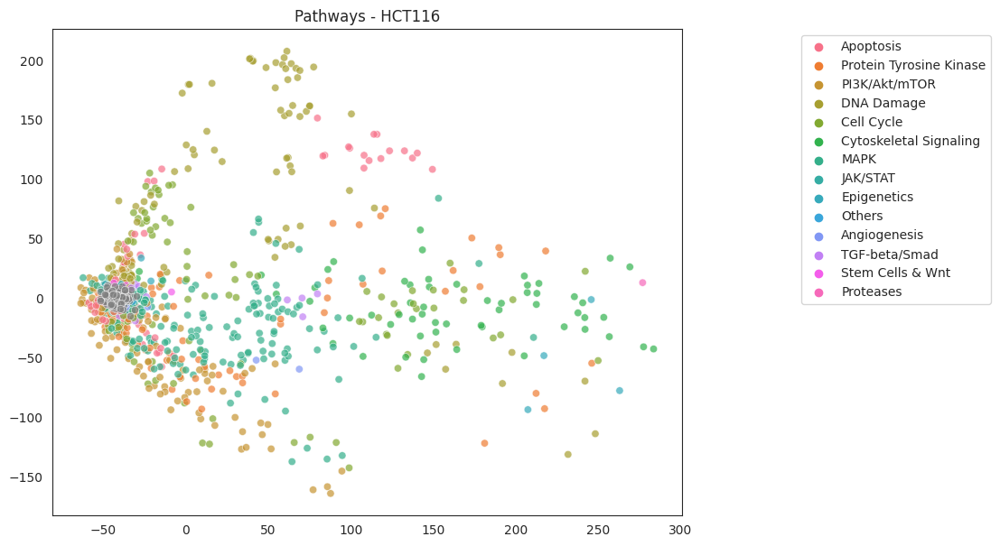

In [12]:
## PCA - Pathway

fig = plt.figure(figsize=(9,7))
ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=df.Metadata_pathway,
    alpha=(0.7),
    marker="o",
    #size=df_toplot["Metadata_cmpd_conc"],
    #palette=pal,
    #legend=False
    )

ax2 = sns.scatterplot(
    x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
    y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
    alpha=(0.7),
    marker="o",
    color='gray',
    )

plt.legend(bbox_to_anchor=(1.5, 1),loc='upper right')
plt.title('Pathways' + ' - ' + cell_line)
plt.show()

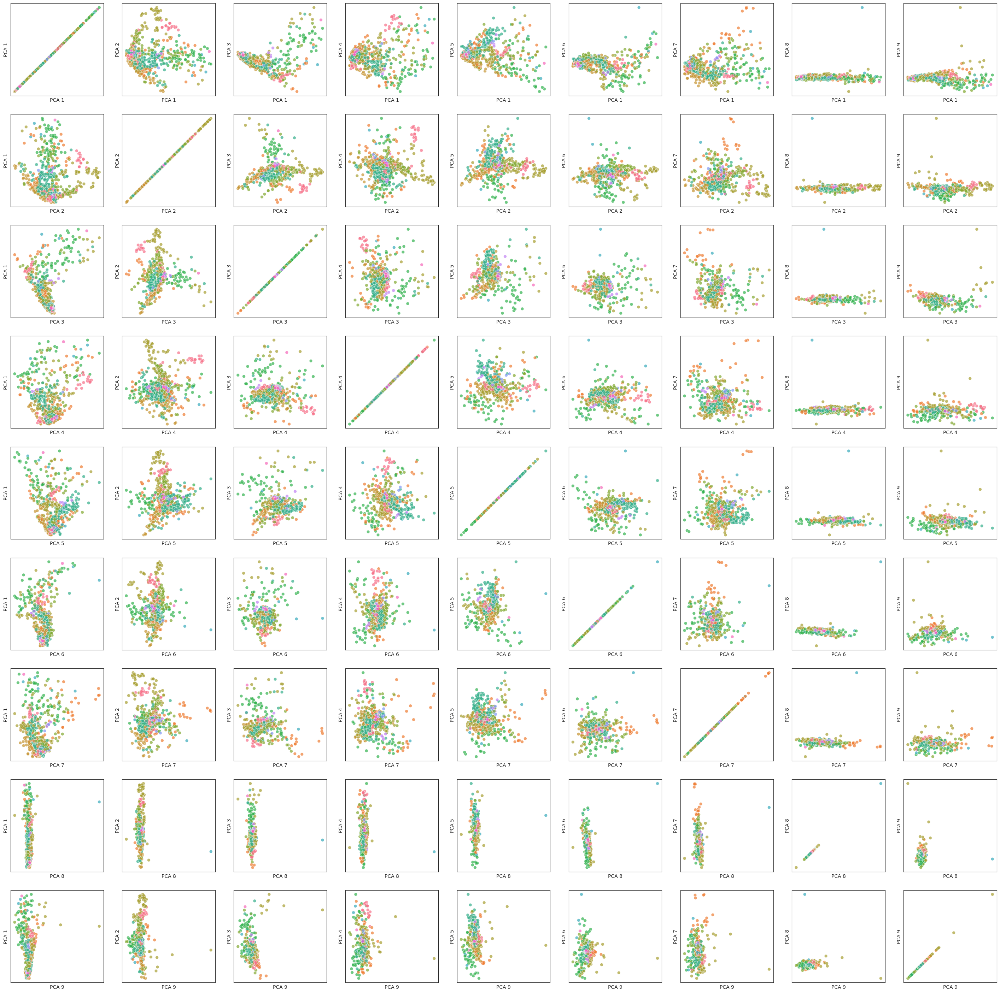

In [13]:
# Look at more dimensions

# Set the number of components
n = 9

# Calculate the PCA
pca = PCA(n_components=n)
pca.fit(training_data)
pca_embedding = pca.transform(training_data)


# Plot the PCAs
fig, axes = plt.subplots(nrows=n, ncols=n, figsize=(n*4, n*4))

for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        sns.scatterplot(
            x=pca_embedding[:, i],
            y=pca_embedding[:, j],
            hue=df.Metadata_pathway,
            alpha=(0.7),
            s=40,
            ax=ax,
            legend=False,
            # palette='viridis_r',
        )
        ax.set_xlabel("PCA {}".format(i + 1))
        ax.set_ylabel("PCA {}".format(j + 1))
        # ax.set_xlabel('PC{} - {:.2f}%'.format(i + 1,pca.explained_variance_ratio_[x]*100), fontsize=14)
        # ax.set_ylabel('PC{} - {:.2f}%'.format(j + 1,pca.explained_variance_ratio_[y]*100), fontsize=14)


        ax.set_xticks([])
        ax.set_yticks([])

# # Save the plot
# fig.savefig("{}/PCA_{}_{}.{}".format(OutputDir2, "grid", 'all_cells_medmean', 'pdf'), dpi=300, bbox_inches='tight')

## Concentration

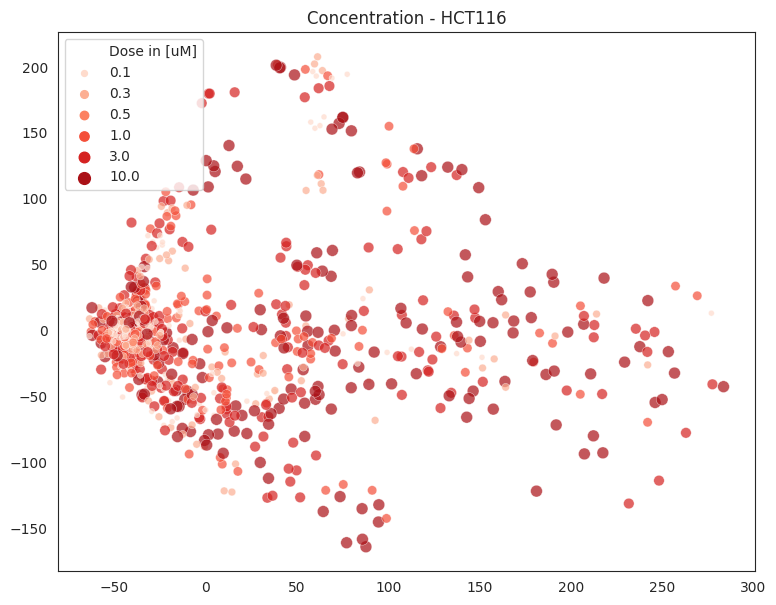

In [14]:
fig = plt.figure(figsize=(9, 7))
ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=df.Metadata_inv_log_conc,
    palette=sns.color_palette("Reds", n_colors=6),
    alpha=(0.7),
    marker="o",
    size=df.Metadata_inv_log_conc,
    label="Dose in [uM]",
    )


# Fix the legend
handles, labels = ax.get_legend_handles_labels()
labels[1:] = [inverse_pDose(10-float(label)).__round__(2) for label in labels[1:]]
handles[0] = plt.Line2D([], [], linestyle='')
plt.legend(handles, labels,loc='upper left')
plt.title('Concentration' + ' - ' + cell_line)
plt.show()


## Grit scores

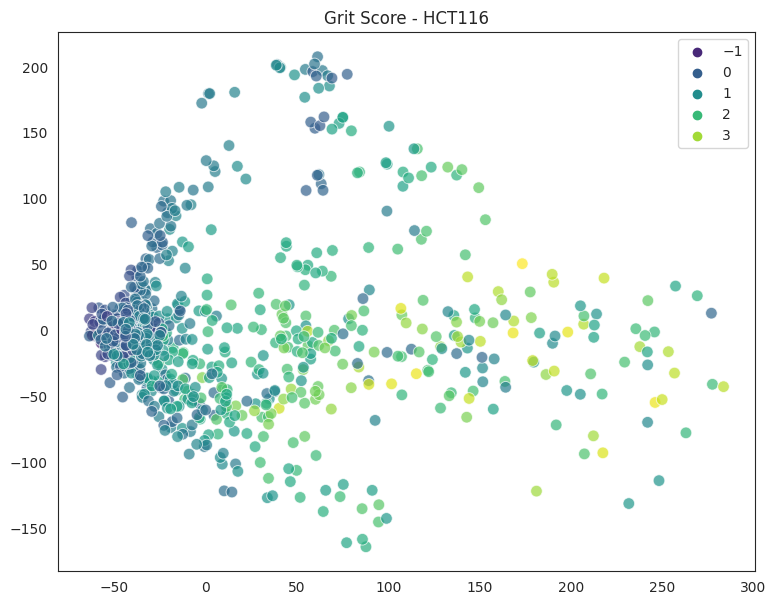

In [15]:
# Overlay grit scores

## UMAP - Grit score
fig = plt.figure(figsize=(9,7))
ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=df.grit,
    alpha=(0.7),
    marker="o",
    s=70,
    palette='viridis',
    )

plt.title('Grit Score' + ' - ' + cell_line)
plt.legend(loc='upper right')
plt.show()


## Viability

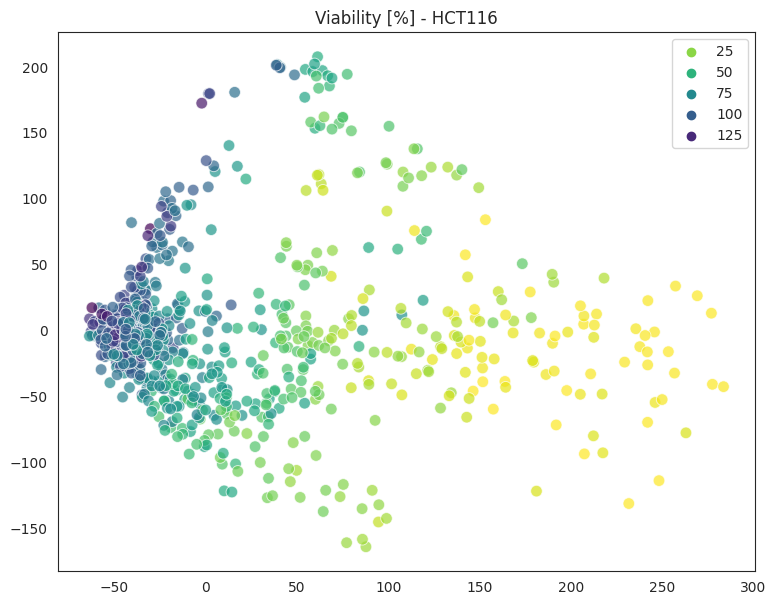

In [16]:
# Overlay viabiltiy scores  

## UMAP - Viability score
fig = plt.figure(figsize=(9,7))
ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=df.AreaOccupied_AreaOccupied_cells_Image,
    alpha=(0.7),
    marker="o",
    s=70,
    palette='viridis_r',
    )

plt.title('Viability [%]' + ' - ' + cell_line)
plt.legend(loc='upper right')
plt.show()

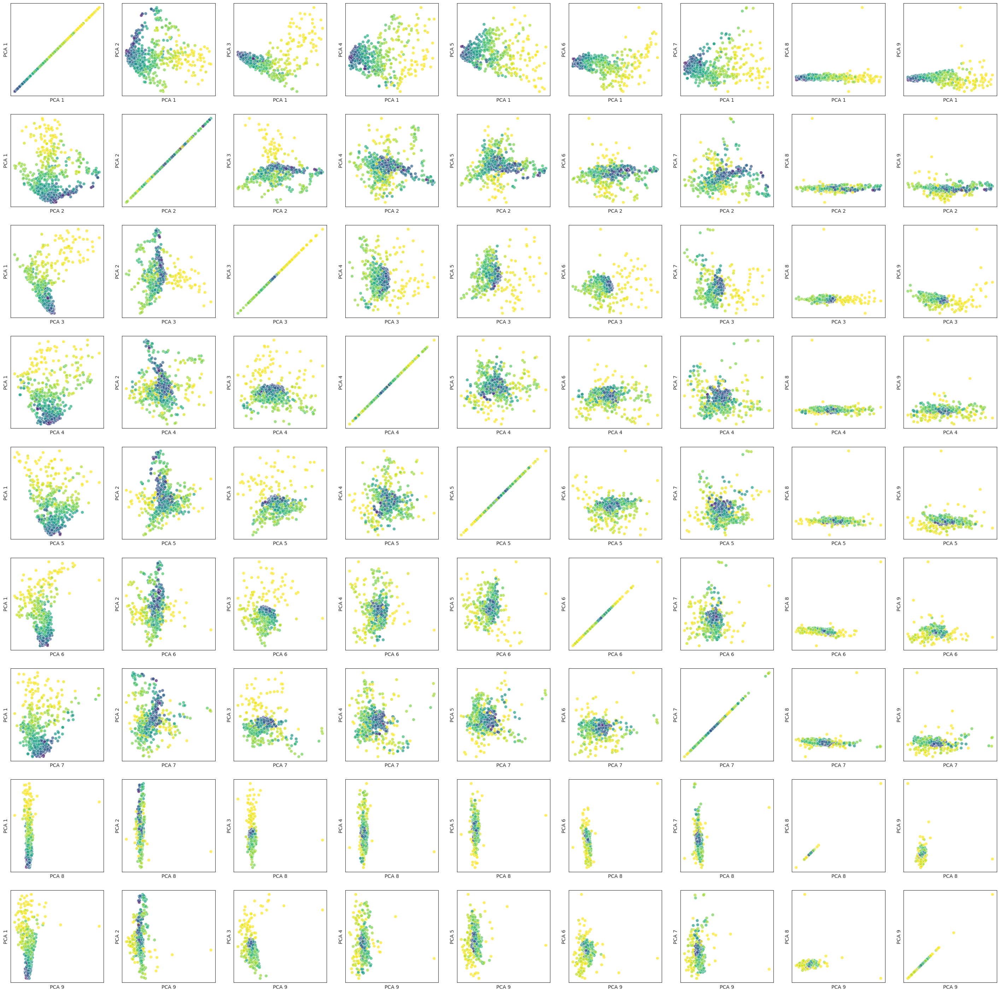

In [17]:
# Look at more dimensions

# Plot the PCAs
fig, axes = plt.subplots(nrows=n, ncols=n, figsize=(n*4, n*4))

for i in range(n):
    for j in range(n):
        ax = axes[i, j]
        sns.scatterplot(
            x=pca_embedding[:, i],
            y=pca_embedding[:, j],
            hue=df.AreaOccupied_AreaOccupied_cells_Image,
            alpha=(0.7),
            s=40,
            ax=ax,
            legend=False,
            palette='viridis_r',
        )
        ax.set_xlabel("PCA {}".format(i + 1))
        ax.set_ylabel("PCA {}".format(j + 1))
        # ax.set_xlabel('PC{} - {:.2f}%'.format(i + 1,pca.explained_variance_ratio_[x]*100), fontsize=14)
        # ax.set_ylabel('PC{} - {:.2f}%'.format(j + 1,pca.explained_variance_ratio_[y]*100), fontsize=14)


        ax.set_xticks([])
        ax.set_yticks([])

# # Save the plot
# fig.savefig("{}/PCA_{}_{}.{}".format(OutputDir2, "grid", 'all_cells_medmean', 'pdf'), dpi=300, bbox_inches='tight')

## Target type

/tmp/ipykernel_561270/2786791998.py:8: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


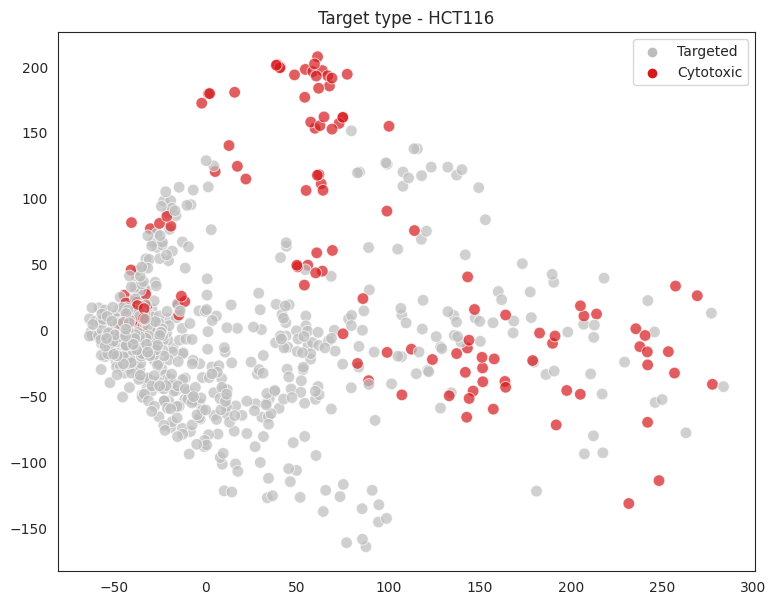

In [18]:
# Overlay target type  

# Have a gray - orange - red colormap
colors = ['#bdbdbd', '#d7191c', '#fdae61']

## UMAP - Viability score
fig = plt.figure(figsize=(9,7))
ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=df.Metadata_target_type,
    alpha=(0.7),
    marker="o",
    s=70,
    palette=colors,
    )



plt.title('Target type' + ' - ' + cell_line)
plt.legend(loc='upper right')
plt.show()

## Clinical phase

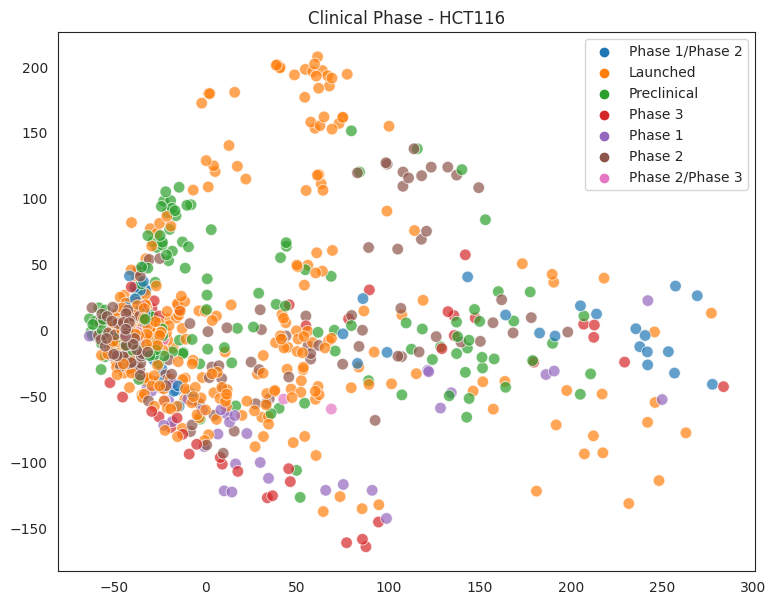

In [19]:
# Overlay clinical phase

## UMAP - Viability score
fig = plt.figure(figsize=(9,7))
ax = sns.scatterplot(
    x=embedding[:, 0],
    y=embedding[:, 1],
    hue=df.Metadata_clinical_status,
    alpha=(0.7),
    marker="o",
    s=70,
    palette="tab10",
    # palette='viridis_r',
    )



plt.title('Clinical Phase' + ' - ' + cell_line)
plt.legend(loc='upper right')
plt.show()

## All together

In [20]:
# Setting up

features = ['Metadata_pathway', 
            'Metadata_inv_log_conc', 
            'grit', 
            'AreaOccupied_AreaOccupied_cells_Image', 
            'Metadata_target_type', 
            'Metadata_layout_id']
            # 'Metadata_clinical_status']
names = ['Pathway', 
         'Concentration', 
         'Grit', 
         'Viability', 
         'Target type', 
         'Plate']
        #  'Clinical status']
palettes = [sns.color_palette(n_colors=14), 
            sns.color_palette("Reds", n_colors=6), 
            'viridis', 
            'viridis_r', 
            ['#bdbdbd', '#d7191c', '#fdae61'], 
            "tab10"]

cells = ['HCT116', 'SW620', 'HT29', 'CACO2', 'COLO205', 'DLD1', 'C1488', 'HCT15']

/tmp/ipykernel_561270/3056666096.py:21: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


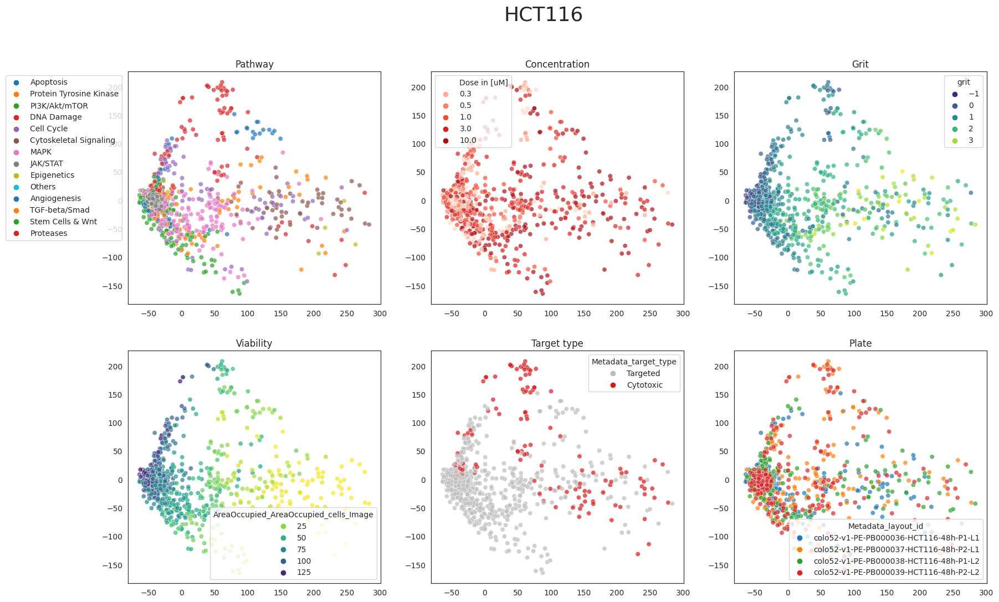

In [21]:
## Plot the data in a grid plot

# Define the number of rows and columns for subplots
nrrow = 2  # Example number of rows
nrcol = 3  # Example number of columns
sp=1

fig, axes = plt.subplots(nrrow, nrcol, figsize=(20, 12))

# remove xlabels
for ax in axes.flat:
    ax.set(xticks=[], yticks=[])

for feat in features:

    # Add a subplot
    ax = fig.add_subplot(nrrow, nrcol, sp)
    ax.title.set_text(names[sp-1])

    ## UMAP - Pathway
    ax = sns.scatterplot(
        x=embedding[:, 0],
        y=embedding[:, 1],
        hue=df[feat],
        alpha=(0.7),
        marker="o",
        # size=df["Metadata_cmpd_conc"],
        palette=palettes[sp-1],
        )

    if names[sp-1] == 'Pathway':
        ax2 = sns.scatterplot(
            x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
            y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
            alpha=(0.7),
            marker="o",
            color='gray',
            )
        plt.legend(bbox_to_anchor=(-0.5, 1),loc='upper left')
    
    if names[sp-1] == 'Concentration':

        # Fix the legend
        handles, labels = ax.get_legend_handles_labels()
        labels[0] = "Dose in [uM]"
        labels[1:] = [inverse_pDose(10-float(label)).__round__(2) for label in labels[1:]]
        handles[0] = plt.Line2D([], [], linestyle='')
        plt.legend(handles, labels,loc='upper left')

    sp +=1
    plt.subplots_adjust(wspace=0.2, hspace=0.2)

plt.suptitle(cell_line, fontsize=26)
plt.show()



/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


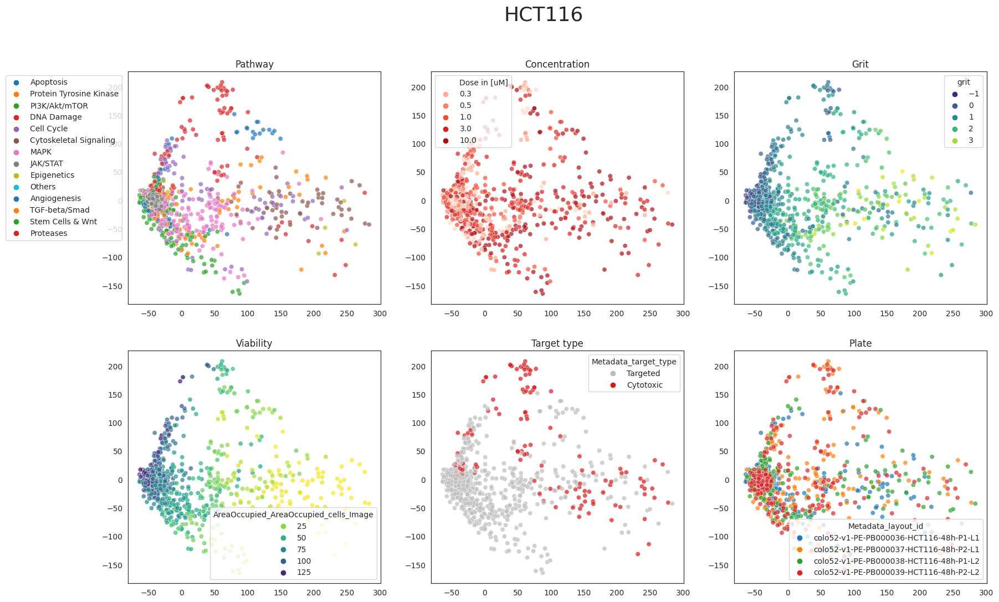

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


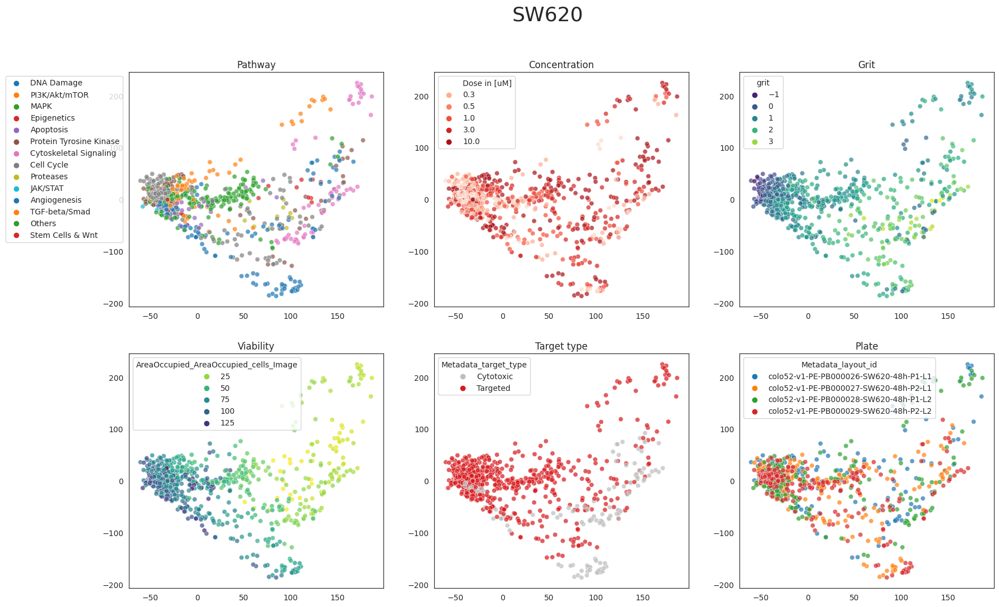

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


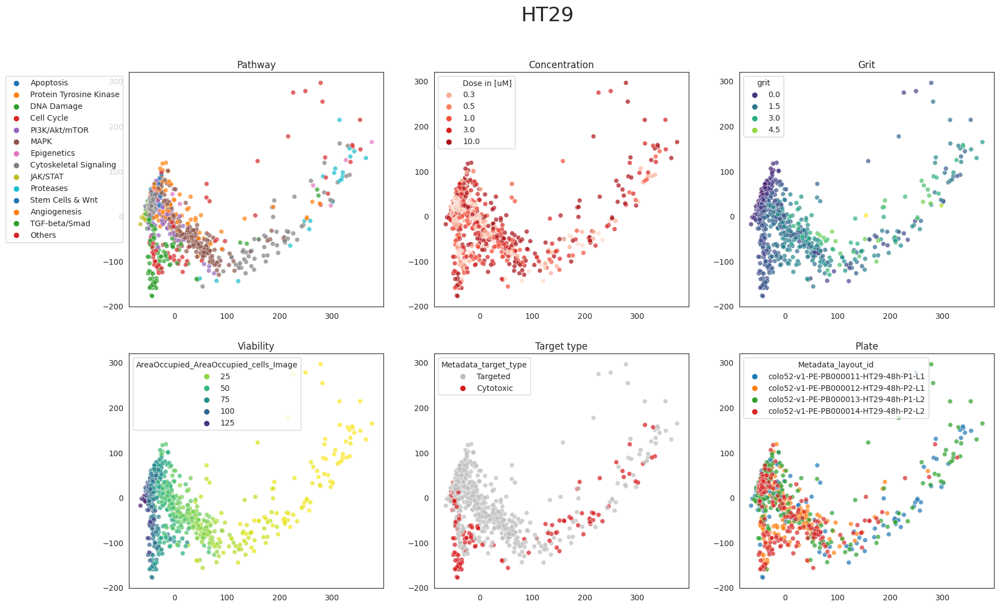

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


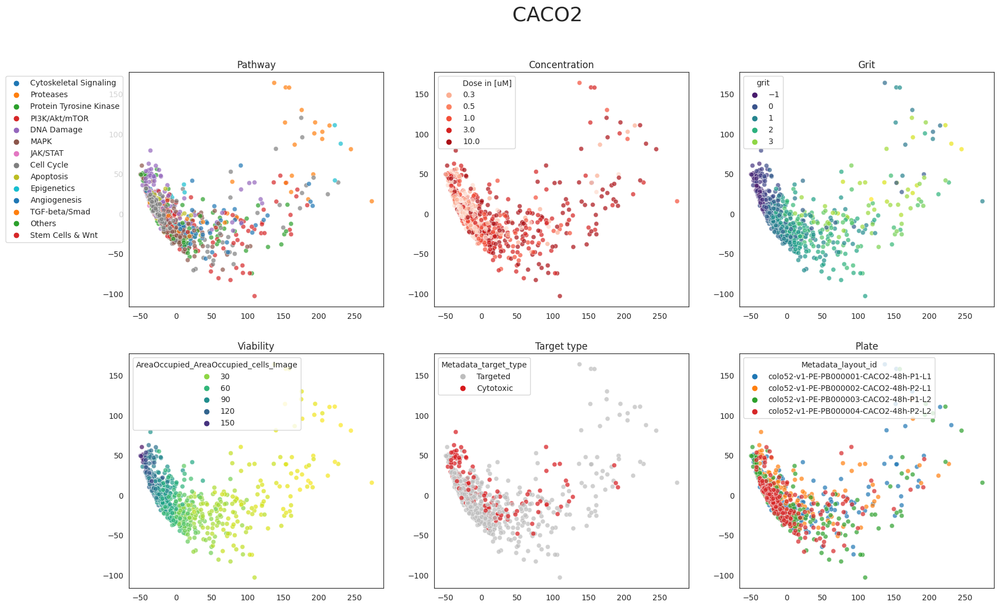

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


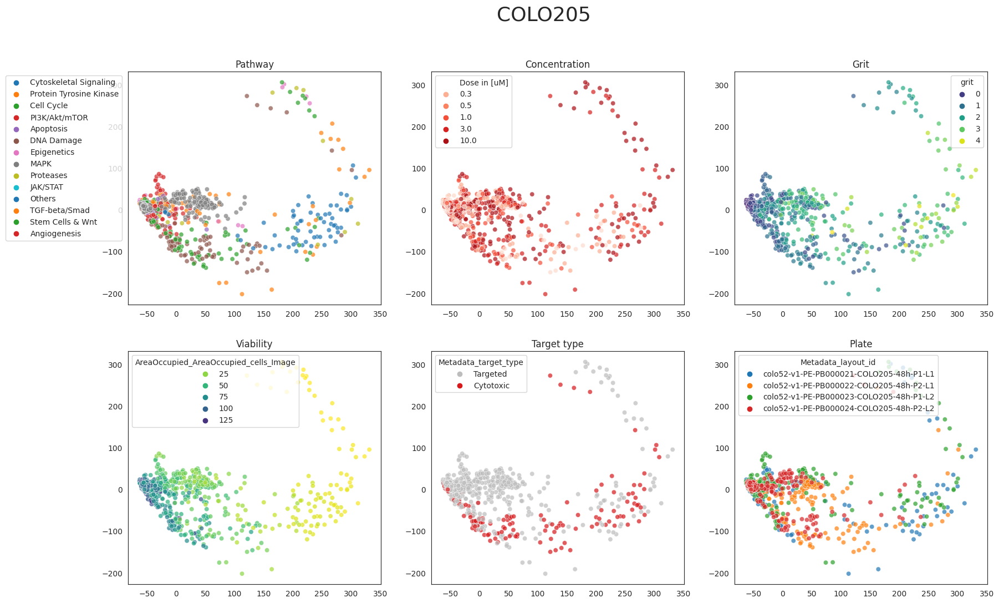

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


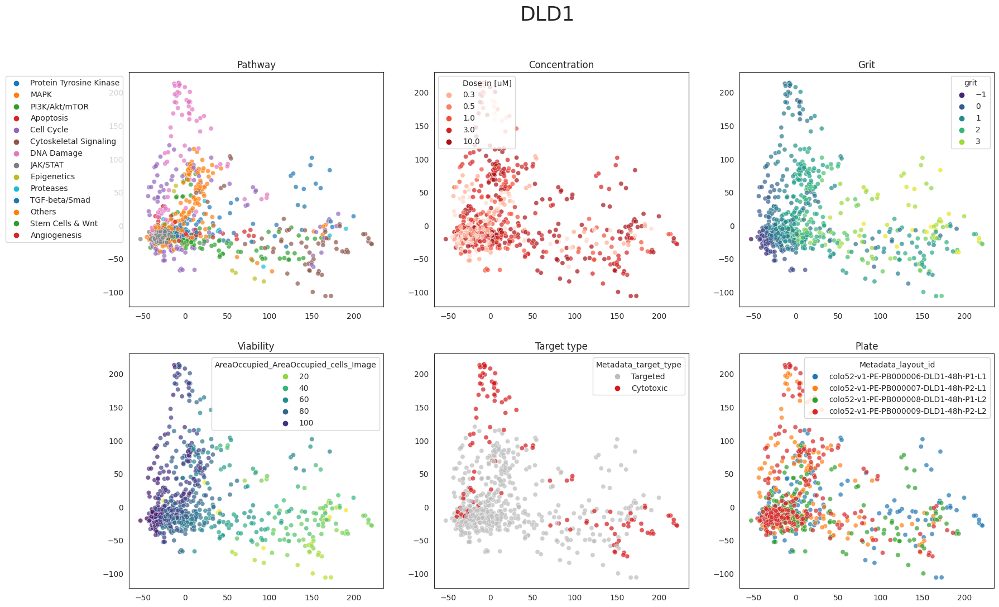

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


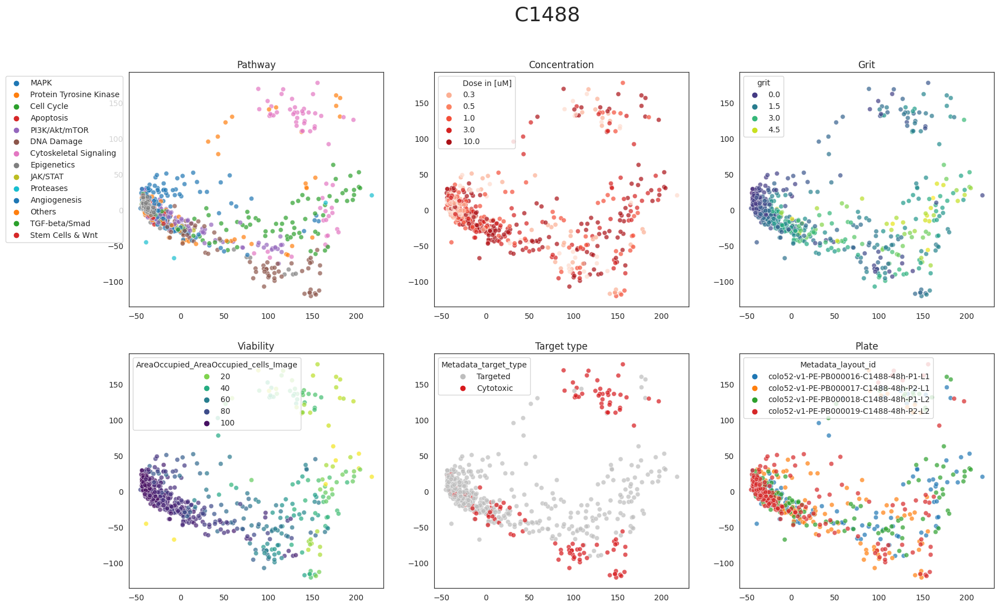

/tmp/ipykernel_561270/3876288371.py:73: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.scatterplot(


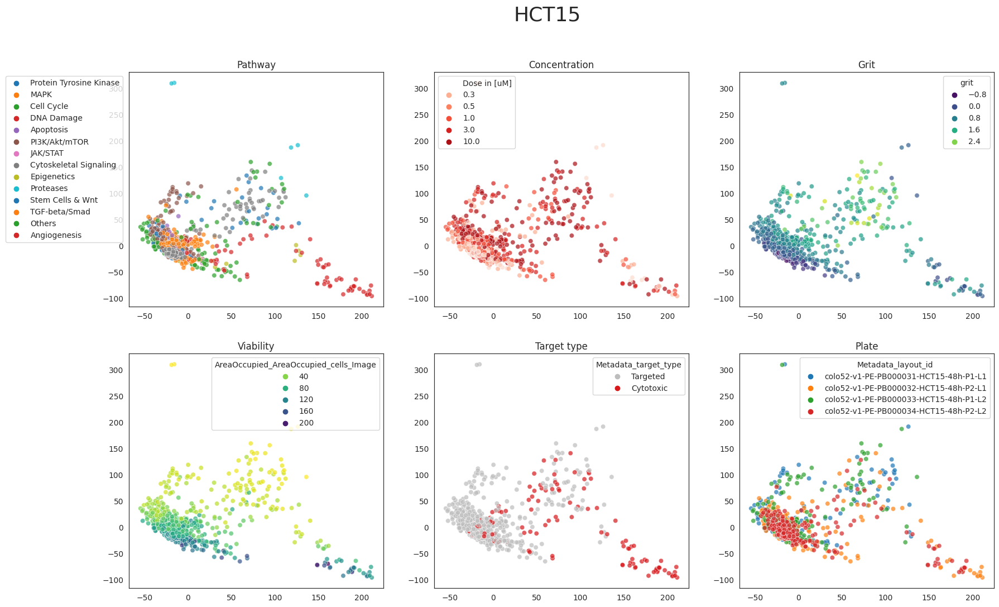

In [22]:
## Plot the data in a grid plot

for cell_line in cells: 

    # Import data 
    selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)
    selected_df['Metadata_inv_log_conc'] = 10 - pDose(selected_df['Metadata_cmpd_conc'])

    if 'AreaOccupied_AreaOccupied_cells_Image' in selected_df.columns.values:
        selected_df.drop('AreaOccupied_AreaOccupied_cells_Image', axis=1, inplace=True)
    
    # Load viabilty data
    dfViability = pd.read_csv("{}viability_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # Load Grit data
    dfGrit= pd.read_csv("{}grit_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # In dfGrit rename the 'Metadata_cmpdname'column to 'Metadata_name'
    dfGrit.rename(columns={'Metadata_cmpdname':'Metadata_name'}, inplace=True)
    
    
    # Combine datasets

    ListToMerge = list(set(dfGrit.columns[dfGrit.columns.str.contains("Metadata_")]) & set(dfViability.columns[dfViability.columns.str.contains("Metadata_")]))
    df_pre = dfViability.merge(dfGrit, on=ListToMerge, how='outer')

    df_pre.drop(['perturbation', 'group'], axis=1, inplace=True)

    # Combine datasets

    ListToMerge = list(set(df_pre.columns[df_pre.columns.str.contains("Metadata_")]) & set(selected_df.columns[selected_df.columns.str.contains("Metadata_")]))
    df = selected_df.merge(df_pre, on=ListToMerge, how='outer')

    # Drop columns if Metadata_barcode is NaN -> somethings wrong with the data
    df = df[df['Metadata_barcode'].notna()]

    # Remove positive controls for plotting
    df = df[df['Metadata_pert_type'] != 'pos_con']

    # List features
    ListOfFeatures = list_features(selected_df)
    
    
    # Calculate the PCA embedding
    training_data = df.loc[:, ListOfFeatures[:]].values 

    # Perform PCA
    pca = PCA(n_components=2)
    pca.fit(training_data)
    embedding = pca.transform(training_data)



    # Define the number of rows and columns for subplots
    nrrow = 2  # Example number of rows
    nrcol = 3  # Example number of columns
    sp=1

    fig, axes = plt.subplots(nrrow, nrcol, figsize=(20, 12))

    # remove xlabels
    for ax in axes.flat:
        ax.set(xticks=[], yticks=[])


    for feat in features:

        # Add a subplot
        ax = fig.add_subplot(nrrow, nrcol, sp)
        ax.title.set_text(names[sp-1])

        ## UMAP - Pathway
        ax = sns.scatterplot(
            x=embedding[:, 0],
            y=embedding[:, 1],
            hue=df[feat],
            alpha=(0.7),
            marker="o",
            # size=df["Metadata_cmpd_conc"],
            palette=palettes[sp-1],
            )

        if names[sp-1] == 'Pathway':
            ax2 = sns.scatterplot(
                x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
                y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
                alpha=(0.7),
                marker="o",
                color='gray',
                )
            plt.legend(bbox_to_anchor=(-0.5, 1),loc='upper left')
        
        if names[sp-1] == 'Concentration':

            # Fix the legend
            handles, labels = ax.get_legend_handles_labels()
            labels[0] = "Dose in [uM]"
            labels[1:] = [inverse_pDose(10-float(label)).__round__(2) for label in labels[1:]]
            handles[0] = plt.Line2D([], [], linestyle='')
            plt.legend(handles, labels,loc='upper left')

        sp +=1
        plt.subplots_adjust(wspace=0.2, hspace=0.2)

    plt.suptitle(cell_line, fontsize=26)
    plt.show()

    fig.savefig(
    "{}/PCA_Metadata_{}.{}".format(OutputDir, cell_line,figformat), dpi=dpi, bbox_inches="tight"
    )

In [23]:

cells = ['HCT116', 'C1488', 'CACO2'] 

# # Have a gray - orange - red colormap
colors = sns.color_palette("tab20", n_colors=14)

# Define a color_dict
label_order = ['Angiogenesis', 'Apoptosis', 'Cell Cycle', 'Cytoskeletal Signaling', 'DNA Damage', 'Epigenetics', 'JAK/STAT', 
               'MAPK', 'PI3K/Akt/mTOR', 'Proteases', 'Protein Tyrosine Kinase', 'Stem Cells & Wnt', 'TGF-beta/Smad', 'Others']
color_dict = dict(zip(label_order, colors))


figformat = 'pdf'


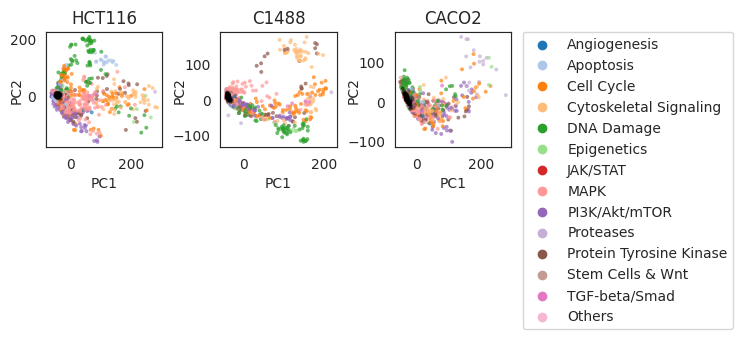

In [36]:
# Plot the 3 PCAs for HCT116, CACO2, and C1488 
# Keep the pathway colorway the same


# Define the number of rows and columns for subplots
nrrow = 1  # Example number of rows
nrcol = 3  # Example number of columns
sp=1

fig, axes = plt.subplots(nrrow, nrcol, figsize=(6, 1.5))

# remove xlabels
for ax in axes.flat:
    ax.set(xticks=[], yticks=[])


for cell_line in cells:

    # Add a subplot
    ax = fig.add_subplot(nrrow, nrcol, sp)
    ax.title.set_text(cell_line)


    # Import data 
    selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)
    selected_df['Metadata_inv_log_conc'] = 10 - pDose(selected_df['Metadata_cmpd_conc'])

    if 'AreaOccupied_AreaOccupied_cells_Image' in selected_df.columns.values:
        selected_df.drop('AreaOccupied_AreaOccupied_cells_Image', axis=1, inplace=True)
    
    # Load viabilty data
    dfViability = pd.read_csv("{}viability_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # Load Grit data
    dfGrit= pd.read_csv("{}grit_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # In dfGrit rename the 'Metadata_cmpdname'column to 'Metadata_name'
    dfGrit.rename(columns={'Metadata_cmpdname':'Metadata_name'}, inplace=True)
    
    
    # Combine datasets

    ListToMerge = list(set(dfGrit.columns[dfGrit.columns.str.contains("Metadata_")]) & set(dfViability.columns[dfViability.columns.str.contains("Metadata_")]))
    df_pre = dfViability.merge(dfGrit, on=ListToMerge, how='outer')

    df_pre.drop(['perturbation', 'group'], axis=1, inplace=True)

    # Combine datasets

    ListToMerge = list(set(df_pre.columns[df_pre.columns.str.contains("Metadata_")]) & set(selected_df.columns[selected_df.columns.str.contains("Metadata_")]))
    df = selected_df.merge(df_pre, on=ListToMerge, how='outer')

    # Drop columns if Metadata_barcode is NaN -> somethings wrong with the data
    df = df[df['Metadata_barcode'].notna()]

    # Remove positive controls for plotting
    df = df[df['Metadata_pert_type'] != 'pos_con']

    # List features
    ListOfFeatures = list_features(selected_df)
    
    # Calculate the PCA embedding
    training_data = df.loc[:, ListOfFeatures[:]].values 

    # Perform PCA
    pca = PCA(n_components=2)
    pca.fit(training_data)
    embedding = pca.transform(training_data)


    ## UMAP - Pathway
    ax = sns.scatterplot(
        x=embedding[:, 0],
        y=embedding[:, 1],
        hue=df['Metadata_pathway'],
        alpha=(0.7),
        marker="o",
        # size=df["Metadata_cmpd_conc"],
        palette=color_dict,
        s=8, edgecolor='none',
        hue_order=label_order,
        )

    ax2 = sns.scatterplot(
        x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
        y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
        alpha=(0.3),
        # marker="o",
        color='black',
        edgecolor='none',
        s=8)

    plt.xlabel('PC1')
    plt.ylabel('PC2', labelpad=-10)

    if sp!=3:
        ax.get_legend().remove()

    sp +=1
    plt.subplots_adjust(wspace=0.5, hspace=0.4)

# Add a legend to the last subplot
ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
plt.show()

fig.savefig(
"{}/PCA_Metadata_3_pathways.{}".format(OutputDir,figformat), dpi=dpi, bbox_inches="tight"
)

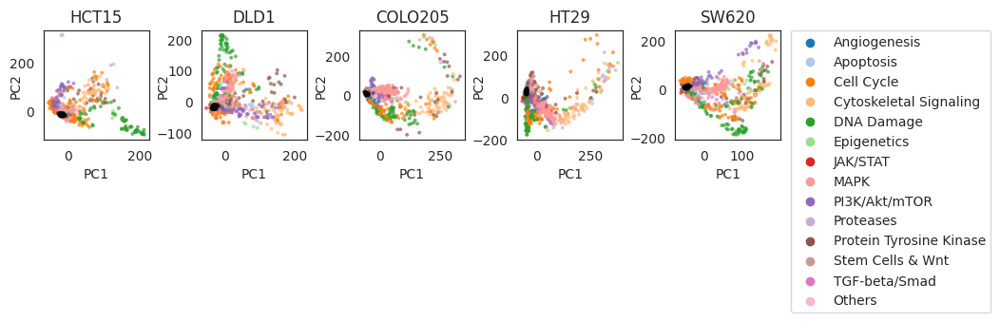

In [33]:
cells = ['HCT15', 'DLD1', 'COLO205', 'HT29', 'SW620'] # Supplemental Figure

# Plot the 3 PCAs for HCT116, CACO2, and C1488 
# Keep the pathway colorway the same


# Define the number of rows and columns for subplots
nrrow = 1  # Example number of rows
nrcol = 5  # Example number of columns
sp=1

fig, axes = plt.subplots(nrrow, nrcol, figsize=(10, 1.5))

# remove xlabels
for ax in axes.flat:
    ax.set(xticks=[], yticks=[])


for cell_line in cells:

    # Add a subplot
    ax = fig.add_subplot(nrrow, nrcol, sp)
    ax.title.set_text(cell_line)


    # Import data 
    selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)
    selected_df['Metadata_inv_log_conc'] = 10 - pDose(selected_df['Metadata_cmpd_conc'])

    if 'AreaOccupied_AreaOccupied_cells_Image' in selected_df.columns.values:
        selected_df.drop('AreaOccupied_AreaOccupied_cells_Image', axis=1, inplace=True)
    
    # Load viabilty data
    dfViability = pd.read_csv("{}viability_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # Load Grit data
    dfGrit= pd.read_csv("{}grit_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # In dfGrit rename the 'Metadata_cmpdname'column to 'Metadata_name'
    dfGrit.rename(columns={'Metadata_cmpdname':'Metadata_name'}, inplace=True)
    
    
    # Combine datasets

    ListToMerge = list(set(dfGrit.columns[dfGrit.columns.str.contains("Metadata_")]) & set(dfViability.columns[dfViability.columns.str.contains("Metadata_")]))
    df_pre = dfViability.merge(dfGrit, on=ListToMerge, how='outer')

    df_pre.drop(['perturbation', 'group'], axis=1, inplace=True)

    # Combine datasets

    ListToMerge = list(set(df_pre.columns[df_pre.columns.str.contains("Metadata_")]) & set(selected_df.columns[selected_df.columns.str.contains("Metadata_")]))
    df = selected_df.merge(df_pre, on=ListToMerge, how='outer')

    # Drop columns if Metadata_barcode is NaN -> somethings wrong with the data
    df = df[df['Metadata_barcode'].notna()]

    # Remove positive controls for plotting
    df = df[df['Metadata_pert_type'] != 'pos_con']

    # List features
    ListOfFeatures = list_features(selected_df)
    
    # Calculate the PCA embedding
    training_data = df.loc[:, ListOfFeatures[:]].values 

    # Perform PCA
    pca = PCA(n_components=2)
    pca.fit(training_data)
    embedding = pca.transform(training_data)


    ## UMAP - Pathway
    ax = sns.scatterplot(
        x=embedding[:, 0],
        y=embedding[:, 1],
        hue=df['Metadata_pathway'],
        alpha=(0.7),
        marker="o",
        # size=df["Metadata_cmpd_conc"],
        palette=color_dict,
        s=8, edgecolor='none',
        hue_order=label_order,
        )

    ax2 = sns.scatterplot(
        x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
        y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
        alpha=(0.3),
        # marker="o",
        color='black',
        edgecolor='none',
        s=8)

    plt.xlabel('PC1')
    plt.ylabel('PC2', labelpad=-10)

    if sp!=5:
        ax.get_legend().remove()

    sp +=1
    plt.subplots_adjust(wspace=0.5, hspace=0.4)

# Add a legend to the last subplot
ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
plt.show()

fig.savefig(
"{}/PCA_Metadata_5_pathways.{}".format(OutputDir,figformat), dpi=dpi, bbox_inches="tight"
)

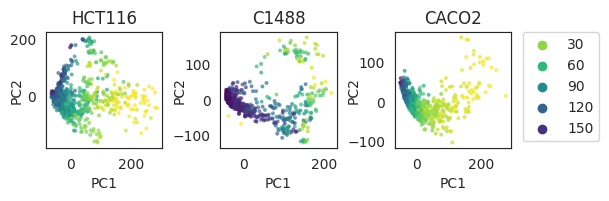

In [35]:
# Plot the 3 PCAs for HCT116, CACO2, and C1488 
# Keep the pathway colorway the same

cells = ['HCT116', 'C1488', 'CACO2'] 
# Define the number of rows and columns for subplots
nrrow = 1  # Example number of rows
nrcol = 3  # Example number of columns
sp=1

fig, axes = plt.subplots(nrrow, nrcol, figsize=(6, 1.5))

# remove xlabels
for ax in axes.flat:
    ax.set(xticks=[], yticks=[])


for cell_line in cells:

    # Add a subplot
    ax = fig.add_subplot(nrrow, nrcol, sp)
    ax.title.set_text(cell_line)


    # Import data 
    selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)
    selected_df['Metadata_inv_log_conc'] = 10 - pDose(selected_df['Metadata_cmpd_conc'])

    if 'AreaOccupied_AreaOccupied_cells_Image' in selected_df.columns.values:
        selected_df.drop('AreaOccupied_AreaOccupied_cells_Image', axis=1, inplace=True)
    
    # Load viabilty data
    dfViability = pd.read_csv("{}viability_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # Load Grit data
    dfGrit= pd.read_csv("{}grit_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # In dfGrit rename the 'Metadata_cmpdname'column to 'Metadata_name'
    dfGrit.rename(columns={'Metadata_cmpdname':'Metadata_name'}, inplace=True)
    
    
    # Combine datasets

    ListToMerge = list(set(dfGrit.columns[dfGrit.columns.str.contains("Metadata_")]) & set(dfViability.columns[dfViability.columns.str.contains("Metadata_")]))
    df_pre = dfViability.merge(dfGrit, on=ListToMerge, how='outer')

    df_pre.drop(['perturbation', 'group'], axis=1, inplace=True)

    # Combine datasets

    ListToMerge = list(set(df_pre.columns[df_pre.columns.str.contains("Metadata_")]) & set(selected_df.columns[selected_df.columns.str.contains("Metadata_")]))
    df = selected_df.merge(df_pre, on=ListToMerge, how='outer')

    # Drop columns if Metadata_barcode is NaN -> somethings wrong with the data
    df = df[df['Metadata_barcode'].notna()]

    # Remove positive controls for plotting
    df = df[df['Metadata_pert_type'] != 'pos_con']

    # List features
    ListOfFeatures = list_features(selected_df)
    
    # Calculate the PCA embedding
    training_data = df.loc[:, ListOfFeatures[:]].values 

    # Perform PCA
    pca = PCA(n_components=2)
    pca.fit(training_data)
    embedding = pca.transform(training_data)


    ## UMAP - Viability
    ax = sns.scatterplot(
        x=embedding[:, 0],
        y=embedding[:, 1],
        hue=df.AreaOccupied_AreaOccupied_cells_Image,
        alpha=(0.7),
        marker="o",
        # size=df["Metadata_cmpd_conc"],
        palette='viridis_r',
        s=8, edgecolor='none',
        )


    # ax2 = sns.scatterplot(
    #     x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
    #     y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
    #     alpha=(0.3),
    #     # marker="o",
    #     color='black',
    #     edgecolor='none',
    #     s=8)

    plt.xlabel('PC1')
    plt.ylabel('PC2', labelpad=-10)

    if sp!=3:
        ax.get_legend().remove()

    sp +=1
    plt.subplots_adjust(wspace=0.5, hspace=0.4)

# Add a legend to the last subplot
ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
plt.show()

fig.savefig(
"{}/PCA_Metadata_3_viability.{}".format(OutputDir,figformat), dpi=dpi, bbox_inches="tight"
)

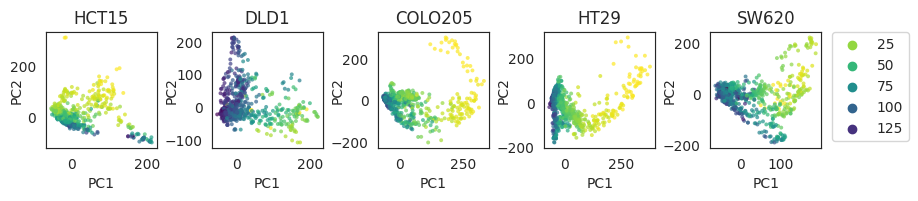

In [37]:
# Plot the 3 PCAs for HCT116, CACO2, and C1488 
# Keep the pathway colorway the same

cells = ['HCT15', 'DLD1', 'COLO205', 'HT29', 'SW620']
# Define the number of rows and columns for subplots
nrrow = 1  # Example number of rows
nrcol = 5  # Example number of columns
sp=1

fig, axes = plt.subplots(nrrow, nrcol, figsize=(10, 1.5))

# remove xlabels
for ax in axes.flat:
    ax.set(xticks=[], yticks=[])


for cell_line in cells:

    # Add a subplot
    ax = fig.add_subplot(nrrow, nrcol, sp)
    ax.title.set_text(cell_line)


    # Import data 
    selected_df = pd.read_csv("{}/selected_data_{}.csv".format(BaseDir,cell_line), index_col=0)
    selected_df['Metadata_inv_log_conc'] = 10 - pDose(selected_df['Metadata_cmpd_conc'])

    if 'AreaOccupied_AreaOccupied_cells_Image' in selected_df.columns.values:
        selected_df.drop('AreaOccupied_AreaOccupied_cells_Image', axis=1, inplace=True)
    
    # Load viabilty data
    dfViability = pd.read_csv("{}viability_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # Load Grit data
    dfGrit= pd.read_csv("{}grit_scores_{}.csv".format(BaseDir,cell_line), index_col=0)

    # In dfGrit rename the 'Metadata_cmpdname'column to 'Metadata_name'
    dfGrit.rename(columns={'Metadata_cmpdname':'Metadata_name'}, inplace=True)
    
    
    # Combine datasets

    ListToMerge = list(set(dfGrit.columns[dfGrit.columns.str.contains("Metadata_")]) & set(dfViability.columns[dfViability.columns.str.contains("Metadata_")]))
    df_pre = dfViability.merge(dfGrit, on=ListToMerge, how='outer')

    df_pre.drop(['perturbation', 'group'], axis=1, inplace=True)

    # Combine datasets

    ListToMerge = list(set(df_pre.columns[df_pre.columns.str.contains("Metadata_")]) & set(selected_df.columns[selected_df.columns.str.contains("Metadata_")]))
    df = selected_df.merge(df_pre, on=ListToMerge, how='outer')

    # Drop columns if Metadata_barcode is NaN -> somethings wrong with the data
    df = df[df['Metadata_barcode'].notna()]

    # Remove positive controls for plotting
    df = df[df['Metadata_pert_type'] != 'pos_con']

    # List features
    ListOfFeatures = list_features(selected_df)
    
    # Calculate the PCA embedding
    training_data = df.loc[:, ListOfFeatures[:]].values 

    # Perform PCA
    pca = PCA(n_components=2)
    pca.fit(training_data)
    embedding = pca.transform(training_data)


    ## UMAP - Viability
    ax = sns.scatterplot(
        x=embedding[:, 0],
        y=embedding[:, 1],
        hue=df.AreaOccupied_AreaOccupied_cells_Image,
        alpha=(0.7),
        marker="o",
        # size=df["Metadata_cmpd_conc"],
        palette='viridis_r',
        s=8, edgecolor='none',
        )


    # ax2 = sns.scatterplot(
    #     x=embedding[(df['Metadata_pert_type'] == 'neg_con'), 0],
    #     y=embedding[(df['Metadata_pert_type'] == 'neg_con'), 1],
    #     alpha=(0.3),
    #     # marker="o",
    #     color='black',
    #     edgecolor='none',
    #     s=8)

    plt.xlabel('PC1')
    plt.ylabel('PC2', labelpad=-10)

    if sp!=5:
        ax.get_legend().remove()

    sp +=1
    plt.subplots_adjust(wspace=0.5, hspace=0.4)

# Add a legend to the last subplot
ax.legend(bbox_to_anchor=(1.1, 1), loc=2, borderaxespad=0.0, fontsize=10)
plt.show()

fig.savefig(
"{}/PCA_Metadata_5_viability.{}".format(OutputDir,figformat), dpi=dpi, bbox_inches="tight"
)